# 1. Library

In [60]:
#DataFrame
import pandas as pd

#Visualisasi data
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.manifold import TSNE
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

#Other Utility
import numpy as np
import statistics as st
from collections import Counter #digunakan menghitung frekuensi kemunculan
import time #untuk mengukur waktu dan jeda waktu 

import warnings
warnings.filterwarnings('ignore')

# 2. IMPORT DATA

In [2]:
df=pd.read_csv('airline_data.csv')

In [3]:
df.head()

,Unnamed: 0,reviews,rates,date,country
0,0,✅ Trip Verified | Excellent service both on th...,\n\t\t\t\t\t\t\t\t\t\t\t\t\t5,24th January 2023,United Kingdom
1,1,✅ Trip Verified | Good lounge at Cape Town. O...,9,24th January 2023,United Kingdom
2,2,✅ Trip Verified | A really excellent journey....,9,23rd January 2023,United Kingdom
3,3,✅ Trip Verified | This flight was one of the ...,9,21st January 2023,United Kingdom
4,4,Not Verified | It seems that there is a race t...,2,19th January 2023,United States


In [4]:
df.shape

(3418, 5)

# 3. CLEAN DATA

# 3.1 Identifikasi Missing Value

In [5]:
df.drop('Unnamed: 0',axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3418 entries, 0 to 3417
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   reviews  3418 non-null   object
 1   rates    3418 non-null   object
 2   date     3418 non-null   object
 3   country  3416 non-null   object
dtypes: object(4)
memory usage: 106.9+ KB


Pada kolom country terdapat 2 data yang NA sehingga nantinya baris yang terdapat NA akan saya drop

In [6]:
df['country'].isna().sum()

2

In [7]:
df.dropna(inplace=True)

In [8]:
df.shape

(3416, 4)

# 3.2 Cek Deskripsi Data

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3416 entries, 0 to 3417
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   reviews  3416 non-null   object
 1   rates    3416 non-null   object
 2   date     3416 non-null   object
 3   country  3416 non-null   object
dtypes: object(4)
memory usage: 133.4+ KB


Pada dataset airlines di semua fiturnya tipe datanya adalah object sehingga, Saya akan merubah tipe datanya :
1. Tipe data category untuk fitur "reviews"
2. Tipe data float untuk fitur "rates"
3. Tipe data datetime untuk fitur "date"

Namun sebelum dilakukan perubahan tipe data, saya cek pada fitur "rates" masih terdapat data yang anomaly sehingga saya akan melakukan cleaning datanya terlebih dahulu

# 3.3 Cleaning fitur "rates"

In [10]:
df.rates.value_counts()

1                                745
2                                385
3                                380
8                                343
10                               302
7                                297
9                                293
4                                232
5                                221
6                                179
\n\t\t\t\t\t\t\t\t\t\t\t\t\t5     34
None                               5
Name: rates, dtype: int64

Data Anomaly :
1. "\n\t\t\t\t\t\t\t\t\t\t\t\t\t5" sebanyak 34 data
2. "None" sebanyak 5 data

<br>Maka untuk itu data yang berisikan "\n\t\t\t\t\t\t\t\t\t\t\t\t\t5" masih dapat diidentifikasikan sebagai rating 5 dan None akan saya buat ke dalam kolom rates Netral yaitu rates 5

In [11]:
#\n\t\t\t\t\t\t\t\t\t\t\t\t\t5 merubah menjadi rates '5'
df['rates'].replace('\n\t\t\t\t\t\t\t\t\t\t\t\t\t5', '5', inplace=True)
# None merubah menjadi rates '5'
df['rates'].replace('None', '5', inplace=True)

In [12]:
df.rates.value_counts()

1     745
2     385
3     380
8     343
10    302
7     297
9     293
5     260
4     232
6     179
Name: rates, dtype: int64

In [13]:
for i in list(df.columns):
    df[i]=df[i].astype('category')
df['date']=pd.to_datetime(df['date'],errors='coerce')
df['rates']=pd.to_numeric(df['rates'],errors='coerce').astype('float')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3416 entries, 0 to 3417
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   reviews  3416 non-null   category      
 1   rates    3416 non-null   float64       
 2   date     3416 non-null   datetime64[ns]
 3   country  3416 non-null   category      
dtypes: category(2), datetime64[ns](1), float64(1)
memory usage: 248.3 KB


Setelah berhasil dilakukan clean pada fitur rates, maka saya akan merubah tipe data dari semua fitur

In [14]:
df.head()

,reviews,rates,date,country
0,✅ Trip Verified | Excellent service both on th...,5.0,2023-01-24,United Kingdom
1,✅ Trip Verified | Good lounge at Cape Town. O...,9.0,2023-01-24,United Kingdom
2,✅ Trip Verified | A really excellent journey....,9.0,2023-01-23,United Kingdom
3,✅ Trip Verified | This flight was one of the ...,9.0,2023-01-21,United Kingdom
4,Not Verified | It seems that there is a race t...,2.0,2023-01-19,United States


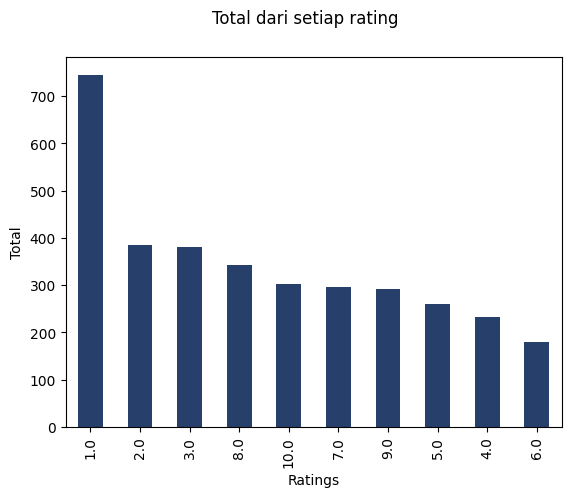

In [15]:
# Visualisasi untuk fitur "rates"

df.rates.value_counts().plot(kind="bar", color=["#273f6b"])
plt.xlabel("Ratings")
plt.ylabel("Total")
plt.suptitle("Total dari setiap rating");

# Visualisasi persebaran nilai "country"

In [18]:
import geopandas as gpd
import plotly.express as px
import pycountry
import country_converter as coco

In [19]:
# Data pada fitur country yang belum di ubah menjadi Country Code Alpha 3
print(df['country'].value_counts())

United Kingdom    2169
United States      361
Australia          145
Canada             107
Germany             58
                  ... 
Oman                 1
Iceland              1
Indonesia            1
Jordan               1
Vietnam              1
Name: country, Length: 69, dtype: int64


In [20]:
def get_alpha3(country_name):
    try:
        return coco.convert(names=country_name, to='ISO3')
    except:
        return None

df['country'] = df['country'].apply(get_alpha3)

In [21]:
# Data pada fitur country yang sudah diubah menjadi Country Code Alpha 3
print(df['country'].value_counts())

GBR    2169
USA     361
AUS     145
CAN     107
DEU      58
       ... 
OMN       1
ISL       1
IDN       1
JOR       1
VNM       1
Name: country, Length: 69, dtype: int64


In [22]:
df.head()

,reviews,rates,date,country
0,✅ Trip Verified | Excellent service both on th...,5.0,2023-01-24,GBR
1,✅ Trip Verified | Good lounge at Cape Town. O...,9.0,2023-01-24,GBR
2,✅ Trip Verified | A really excellent journey....,9.0,2023-01-23,GBR
3,✅ Trip Verified | This flight was one of the ...,9.0,2023-01-21,GBR
4,Not Verified | It seems that there is a race t...,2.0,2023-01-19,USA


In [23]:
# Membuat Index baru dimana dari fitur country kita bisa melihat banyaknya penumpang dari setiap negara
df_country_review = df['country'].value_counts().reset_index()
df_country_review.columns = ['country', 'banyak penumpang']
df_country_review

,country,banyak penumpang
0,GBR,2169
1,USA,361
2,AUS,145
3,CAN,107
4,DEU,58
...,...,...
64,OMN,1
65,ISL,1
66,IDN,1
67,JOR,1


In [24]:
df_country_review = pd.DataFrame({
    'country': df['country'].value_counts().index,
    'banyak penumpang': df['country'].value_counts().values
})

In [27]:
# hitung total review per negara
df_country_review = df_country_review.groupby('country').agg({'banyak penumpang': 'mean'}).reset_index()
df_country_review.columns = ['country', 'banyak penumpang']

# buat peta choropleth dengan Plotly Express
fig = px.choropleth(df_country_review, locations='country',
                    color='banyak penumpang',
                    labels=dict(country='Country', total_review_per_negara='Banyaknya Penumpang'),
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

Dari visualisasi persebaran banyaknya penumpang yang menggunakan penerbangan, dihasilkan banyaknya penumpang akan digambarkan dari warna biru sampai dengan kuning

In [28]:
df_sorted = df_country_review.sort_values('banyak penumpang', ascending=False)

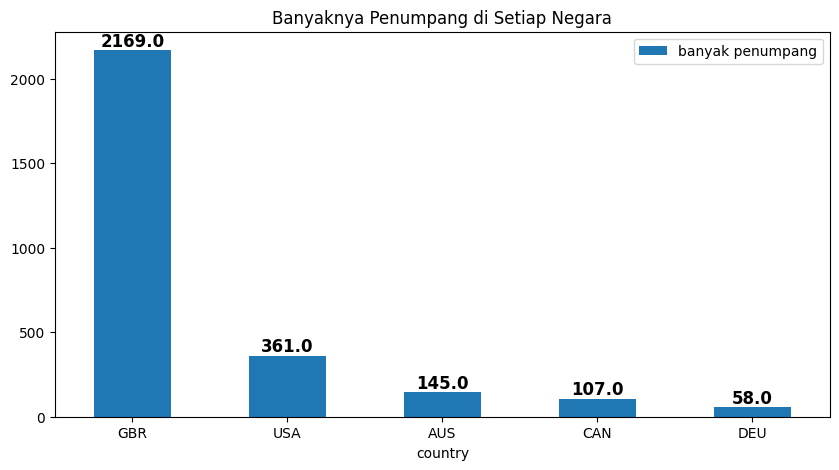

In [31]:
fig, ax = plt.subplots(figsize=(10,5))
df_sorted.head().plot(kind='bar', x='country', ax=ax)
ax.set_title('Banyaknya Penumpang di Setiap Negara')
ax.set_xticklabels(df_sorted.head()['country'], rotation=0)

# Menambahkan label nilai penumpang pada setiap bar
for i, val in enumerate(df_sorted.head()['banyak penumpang']):
    ax.text(i, val, val, horizontalalignment='center', verticalalignment='bottom', fontdict={'fontweight': 'bold', 'size': 12})
    
plt.show()

# Analisis Data Menggunakan Teknik NLP
(Ditahap ini akan dilakukan proses number removal, whitecase removal, punctuation removal dan word_tokenize() untuk memecah string kedalam tokens)

In [42]:
import nltk
import re
import string
import spacy
nlp = spacy.load('en_core_web_sm')

import gensim #membangun model dari NLP

from spacy.lang.en.stop_words import STOP_WORDS
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, PorterStemmer, LancasterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize 
from nltk.probability import FreqDist

from textblob import TextBlob

In [36]:
# Preprocessing teks 
def preprocess(text,remove_digits=True):
    text = re.sub('\s+',' ', text)
    text = re.sub("(?<!\w)\d+", "", text)
    text = re.sub("-(?!\w)|(?<!\w)-", "", text)
    text=text.lower()
    nopunc=[char for char in text if char not in string.punctuation]
    nopunc=''.join(nopunc)
    nopunc=' '.join([word for word in nopunc.split() if word.lower() not in stopwords.words('english')])   # Untuk menghapus stopword
    
    return nopunc

# lemmatize Merubah kata kata bahasa inggris menjadi kata dasarnya, contoh reading -> read
# Pada bahasa Indonesia proses lemmatize yang sering digunakan adalah sastrawi
def lemmatize(words):
    words=nlp(words)
    lemmas = []
    for word in words:
        lemmas.append(word.lemma_)
    return lemmas

# Melakukan konfersi ke String
def listtostring(s):
    str1=' '
    return (str1.join(s))

def clean_text(input):
    word=preprocess(input)
    lemmas=lemmatize(word)
    return listtostring(lemmas)

Pada kolom 'reviews' tertera reviews dari penumpang di bagi menjadi 2 yaitu yang 'Verified' dan 'Not Verified' sehingga saya akan buatkan kolom baru untuk mengetahui review tersebut verified atau tidak

In [37]:
df['terverifikasi']=df['reviews'].str.contains("Trip Verified") # str.contains = digunakan untuk melihat dan mencocokan string di suatu kolom
df.head()

,reviews,rates,date,country,terverifikasi
0,✅ Trip Verified | Excellent service both on th...,5.0,2023-01-24,GBR,True
1,✅ Trip Verified | Good lounge at Cape Town. O...,9.0,2023-01-24,GBR,True
2,✅ Trip Verified | A really excellent journey....,9.0,2023-01-23,GBR,True
3,✅ Trip Verified | This flight was one of the ...,9.0,2023-01-21,GBR,True
4,Not Verified | It seems that there is a race t...,2.0,2023-01-19,USA,False


In [38]:
#Melihat banyaknya data 'terverivikasi' dan tidak
df['terverifikasi'].value_counts()

False    2440
True      976
Name: terverifikasi, dtype: int64

Penjelasan terkait dengan Preprocesing Teks

<font color="red">1. text = re.sub('\s+',' ', text)</font>
<br>Untuk menghapus karakter non-numerical seperti : tanda baca(.,!?), operator matematika (-+=*), tanda spesial (@#$) dan Karakter kosong
    
<font color="red">2. text = re.sub("(?<!\w)\d+", "", text)</font>
<br>Menghapus semua karakter numerik diantara string contoh "ini teks 123 angka" mejadi "ini teks angka"
       
<font color="red">3. text = re.sub("-(?!\w)|(?<!\w)-", "", text)</font>
<br>Menghapus semua tanda pisah | dan tanda hubung - di atara kata
 
<font color="red">4. text=text.lower()</font>
   <font color="red"><br>nopunc=[char for char in text if char not in string.punctuation]</font>
<br>'text.lower()' digunakan untuk mengubah seluruh karakter dalam text menjadi lowercase.
<br>'char for char in text if char not in string.punctuation' adalah sebuah list comprehension yang memeriksa setiap karakter dalam text dan memasukkannya ke dalam list nopunc jika karakter tersebut bukan tanda baca.

In [39]:
# Membuat fitur baru yang dimana hasil dari fitur review yang memiliki "✅ Trip Verified |" akan di hapus dan dimasukan ke fitur Clean 
df['Clean']=df['reviews'].str.strip("✅ Trip Verified |").apply(clean_text)
detik = time.time()

print("Waktu yang dibutuhkan dalam proses =", detik)

Waktu yang dibutuhkan dalam proses = 1681191293.3847575


In [40]:
df.head()

,reviews,rates,date,country,terverifikasi,Clean
0,✅ Trip Verified | Excellent service both on th...,5.0,2023-01-24,GBR,True,excellent service ground board first class pro...
1,✅ Trip Verified | Good lounge at Cape Town. O...,9.0,2023-01-24,GBR,True,good lounge cape town time departure drink hig...
2,✅ Trip Verified | A really excellent journey....,9.0,2023-01-23,GBR,True,really excellent journey lounge overcrowded la...
3,✅ Trip Verified | This flight was one of the ...,9.0,2023-01-21,GBR,True,flight one bad ever life want pamper buy busin...
4,Not Verified | It seems that there is a race t...,2.0,2023-01-19,USA,False,verify seem race bottom amongst airline can no...


In [43]:
# Membuat fungsi polarity
def getpolarity(text):
    return TextBlob(text).sentiment.polarity

#Polarity adalah tolak ukur dari sentimen analisis dimana suatu teks dapat dianggap positif, negatif atau netral

# Membuat fungsi dari sentimen
def analysis(score):
    if score <= 0:
        return 'Negative'
    else:
        return 'Positive'

# Membuat fitur polarity dari fungsi polarity
df['polarity']=df['Clean'].apply(getpolarity)
# Membuat fitur sentimen dari fungsi analysis
df['sentiment']=df['polarity'].apply(analysis)
df.head()

,reviews,rates,date,country,terverifikasi,Clean,polarity,sentiment
0,✅ Trip Verified | Excellent service both on th...,5.0,2023-01-24,GBR,True,excellent service ground board first class pro...,0.311905,Positive
1,✅ Trip Verified | Good lounge at Cape Town. O...,9.0,2023-01-24,GBR,True,good lounge cape town time departure drink hig...,0.260000,Positive
2,✅ Trip Verified | A really excellent journey....,9.0,2023-01-23,GBR,True,really excellent journey lounge overcrowded la...,0.245059,Positive
3,✅ Trip Verified | This flight was one of the ...,9.0,2023-01-21,GBR,True,flight one bad ever life want pamper buy busin...,-0.031331,Negative
4,Not Verified | It seems that there is a race t...,2.0,2023-01-19,USA,False,verify seem race bottom amongst airline can no...,-0.078125,Negative


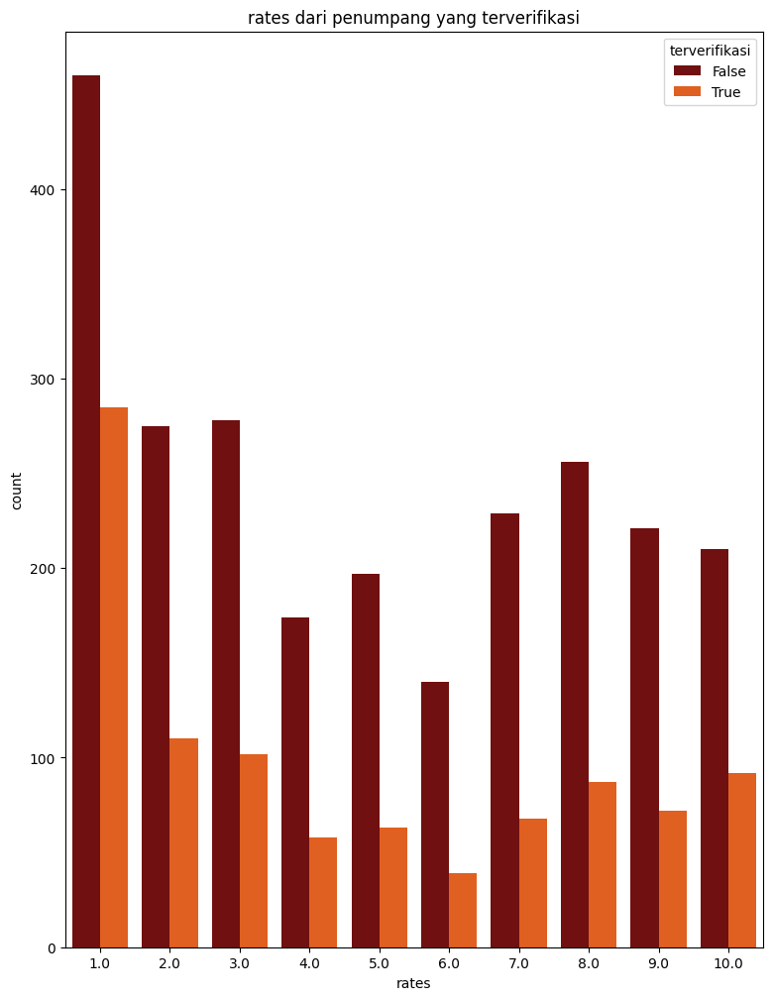

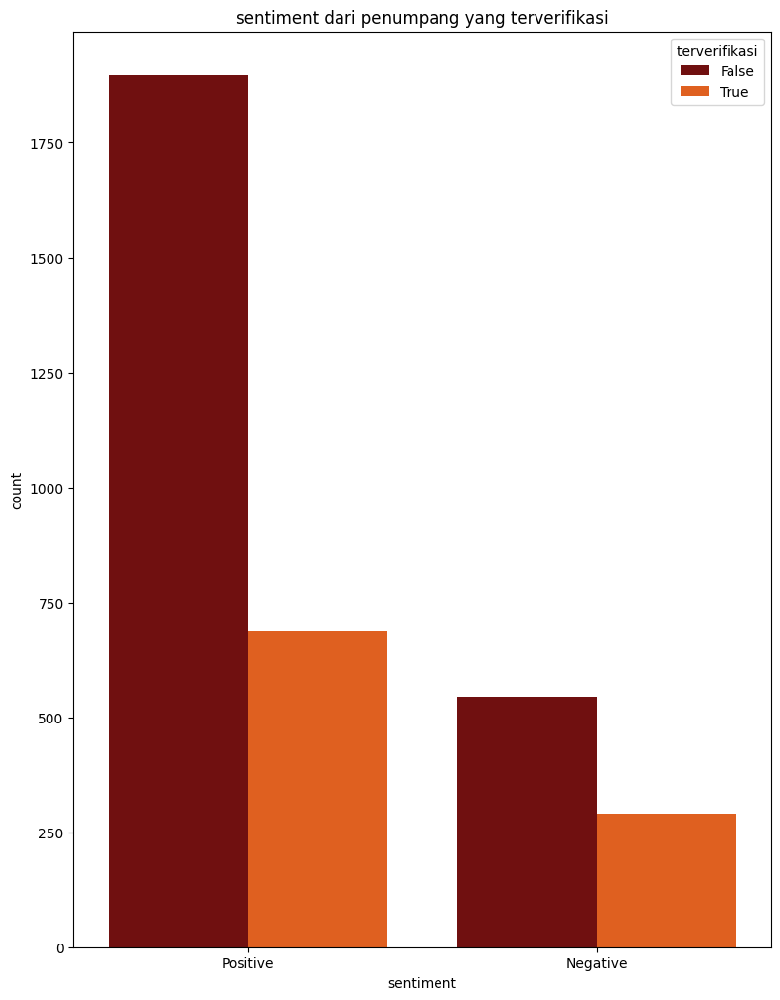

In [44]:
lst=['rates','sentiment']
for i in range(len(lst)):
    plt.figure(figsize=(20,12))
    plt.subplot(1,2,i+1)
    sns.countplot(data=df, x=lst[i],hue='terverifikasi',palette='gist_heat')
    plt.xlabel(lst[i])
    plt.title(lst[i]+' dari penumpang yang terverifikasi')
plt.show()

# EDA

# Tokenisasi

In [45]:
def word_tokenize_wrapper(teks):
    return word_tokenize(teks)

df['review_tokenize'] = df['Clean'].apply(word_tokenize_wrapper)

In [46]:
reviews = ' '.join(str(v) for v in df['Clean'])

In [47]:
token_reviews = word_tokenize(reviews)

In [56]:
token_reviews

['excellent',
 'service',
 'ground',
 'board',
 'first',
 'class',
 'product',
 'might',
 'lead',
 'edge',
 'service',
 'around',
 'entire',
 'experience',
 'well',
 'worth',
 'cost',
 'ticket',
 'concorde',
 'room',
 'heathrow',
 'well',
 'manage',
 'great',
 'place',
 'relax',
 'prior',
 'trip',
 'flight',
 'slightly',
 'delay',
 'heathrow',
 'arrive',
 'schedule',
 'johannesburg',
 'good',
 'lounge',
 'cape',
 'town',
 'time',
 'departure',
 'drink',
 'high',
 'quality',
 'sound',
 'dinner',
 'service',
 'breakfast',
 'reasonable',
 'arrival',
 'lounge',
 'good',
 'shower',
 'cold',
 'really',
 'excellent',
 'journey',
 'lounge',
 'overcrowded',
 'late',
 'afternoon',
 'plenty',
 'edible',
 'food',
 'easy',
 'board',
 'new',
 'club',
 'world',
 'suite',
 'great',
 'compare',
 'last',
 'travel',
 'year',
 'ago',
 'food',
 'drink',
 'back',
 'previous',
 'standard',
 'choice',
 'individual',
 'wine',
 'rather',
 'bland',
 'blend',
 'course',
 'serve',
 'individually',
 'cut',
 'glass'

In [57]:
len(token_reviews)

292183

# Stemming

In [52]:

# Menggunakan SnowballStemmer dimana stemming ini menggunakan kata yang sudah di tokenize sebelumnya
snowball = SnowballStemmer('english')

from nltk.tokenize import word_tokenize
word_tokenize = word_tokenize(reviews)

for word in word_tokenize:
    print('Original Word: {} \t | Stemmed Word: {}'. format(word, snowball.stem(word)))

Original Word: excellent 	 | Stemmed Word: excel
Original Word: service 	 | Stemmed Word: servic
Original Word: ground 	 | Stemmed Word: ground
Original Word: board 	 | Stemmed Word: board
Original Word: first 	 | Stemmed Word: first
Original Word: class 	 | Stemmed Word: class
Original Word: product 	 | Stemmed Word: product
Original Word: might 	 | Stemmed Word: might
Original Word: lead 	 | Stemmed Word: lead
Original Word: edge 	 | Stemmed Word: edg
Original Word: service 	 | Stemmed Word: servic
Original Word: around 	 | Stemmed Word: around
Original Word: entire 	 | Stemmed Word: entir
Original Word: experience 	 | Stemmed Word: experi
Original Word: well 	 | Stemmed Word: well
Original Word: worth 	 | Stemmed Word: worth
Original Word: cost 	 | Stemmed Word: cost
Original Word: ticket 	 | Stemmed Word: ticket
Original Word: concorde 	 | Stemmed Word: concord
Original Word: room 	 | Stemmed Word: room
Original Word: heathrow 	 | Stemmed Word: heathrow
Original Word: well 	 | Stem

Original Word: wear 	 | Stemmed Word: wear
Original Word: mask 	 | Stemmed Word: mask
Original Word: ask 	 | Stemmed Word: ask
Original Word: flight 	 | Stemmed Word: flight
Original Word: attendant 	 | Stemmed Word: attend
Original Word: allow 	 | Stemmed Word: allow
Original Word: people 	 | Stemmed Word: peopl
Original Word: wear 	 | Stemmed Word: wear
Original Word: mask 	 | Stemmed Word: mask
Original Word: say 	 | Stemmed Word: say
Original Word: medical 	 | Stemmed Word: medic
Original Word: exception 	 | Stemmed Word: except
Original Word: order 	 | Stemmed Word: order
Original Word: drink 	 | Stemmed Word: drink
Original Word: reply 	 | Stemmed Word: repli
Original Word: need 	 | Stemmed Word: need
Original Word: pick 	 | Stemmed Word: pick
Original Word: business 	 | Stemmed Word: busi
Original Word: class 	 | Stemmed Word: class
Original Word: customer 	 | Stemmed Word: custom
Original Word: service 	 | Stemmed Word: servic
Original Word: british 	 | Stemmed Word: british
Or

Original Word: especially 	 | Stemmed Word: especi
Original Word: tofrom 	 | Stemmed Word: tofrom
Original Word: amsterdam 	 | Stemmed Word: amsterdam
Original Word: germany 	 | Stemmed Word: germani
Original Word: also 	 | Stemmed Word: also
Original Word: customer 	 | Stemmed Word: custom
Original Word: service 	 | Stemmed Word: servic
Original Word: seem 	 | Stemmed Word: seem
Original Word: `` 	 | Stemmed Word: ``
Original Word: minimum 	 | Stemmed Word: minimum
Original Word: care 	 | Stemmed Word: care
Original Word: `` 	 | Stemmed Word: ``
Original Word: proposition 	 | Stemmed Word: proposit
Original Word: provide 	 | Stemmed Word: provid
Original Word: strictly 	 | Stemmed Word: strict
Original Word: require 	 | Stemmed Word: requir
Original Word: law 	 | Stemmed Word: law
Original Word: customer 	 | Stemmed Word: custom
Original Word: complain 	 | Stemmed Word: complain
Original Word: take 	 | Stemmed Word: take
Original Word: long 	 | Stemmed Word: long
Original Word: possib

Original Word: nt 	 | Stemmed Word: nt
Original Word: stay 	 | Stemmed Word: stay
Original Word: upright 	 | Stemmed Word: upright
Original Word: ife 	 | Stemmed Word: ife
Original Word: system 	 | Stemmed Word: system
Original Word: badly 	 | Stemmed Word: bad
Original Word: need 	 | Stemmed Word: need
Original Word: upgrade 	 | Stemmed Word: upgrad
Original Word: power 	 | Stemmed Word: power
Original Word: port 	 | Stemmed Word: port
Original Word: seat 	 | Stemmed Word: seat
Original Word: gruele 	 | Stemmed Word: gruel
Original Word: hr 	 | Stemmed Word: hr
Original Word: flight 	 | Stemmed Word: flight
Original Word: bad 	 | Stemmed Word: bad
Original Word: thought 	 | Stemmed Word: thought
Original Word: air 	 | Stemmed Word: air
Original Word: canada 	 | Stemmed Word: canada
Original Word: light 	 | Stemmed Word: light
Original Word: year 	 | Stemmed Word: year
Original Word: ahead 	 | Stemmed Word: ahead
Original Word: ba 	 | Stemmed Word: ba
Original Word: london 	 | Stemmed 

Original Word: have 	 | Stemmed Word: have
Original Word: nt 	 | Stemmed Word: nt
Original Word: turn 	 | Stemmed Word: turn
Original Word: floor 	 | Stemmed Word: floor
Original Word: around 	 | Stemmed Word: around
Original Word: seat 	 | Stemmed Word: seat
Original Word: vacuum 	 | Stemmed Word: vacuum
Original Word: properly 	 | Stemmed Word: proper
Original Word: look 	 | Stemmed Word: look
Original Word: flight 	 | Stemmed Word: flight
Original Word: attendant 	 | Stemmed Word: attend
Original Word: see 	 | Stemmed Word: see
Original Word: jacket 	 | Stemmed Word: jacket
Original Word: could 	 | Stemmed Word: could
Original Word: hung 	 | Stemmed Word: hung
Original Word: fa 	 | Stemmed Word: fa
Original Word: take 	 | Stemmed Word: take
Original Word: jacket 	 | Stemmed Word: jacket
Original Word: stuff 	 | Stemmed Word: stuff
Original Word: overhead 	 | Stemmed Word: overhead
Original Word: locker 	 | Stemmed Word: locker
Original Word: invite 	 | Stemmed Word: invit
Original W

Original Word: list 	 | Stemmed Word: list
Original Word: rearrange 	 | Stemmed Word: rearrang
Original Word: one 	 | Stemmed Word: one
Original Word: open 	 | Stemmed Word: open
Original Word: till 	 | Stemmed Word: till
Original Word: gmt 	 | Stemmed Word: gmt
Original Word: greek 	 | Stemmed Word: greek
Original Word: one 	 | Stemmed Word: one
Original Word: long 	 | Stemmed Word: long
Original Word: use 	 | Stemmed Word: use
Original Word: website 	 | Stemmed Word: websit
Original Word: also 	 | Stemmed Word: also
Original Word: useless 	 | Stemmed Word: useless
Original Word: experience 	 | Stemmed Word: experi
Original Word: technical 	 | Stemmed Word: technic
Original Word: difficulty 	 | Stemmed Word: difficulti
Original Word: try 	 | Stemmed Word: tri
Original Word: later 	 | Stemmed Word: later
Original Word: stressful 	 | Stemmed Word: stress
Original Word: hour 	 | Stemmed Word: hour
Original Word: later 	 | Stemmed Word: later
Original Word: manage 	 | Stemmed Word: manag


Original Word: ground 	 | Stemmed Word: ground
Original Word: staff 	 | Stemmed Word: staff
Original Word: polite 	 | Stemmed Word: polit
Original Word: helpful 	 | Stemmed Word: help
Original Word: food 	 | Stemmed Word: food
Original Word: good 	 | Stemmed Word: good
Original Word: outward 	 | Stemmed Word: outward
Original Word: slightly 	 | Stemmed Word: slight
Original Word: poor 	 | Stemmed Word: poor
Original Word: quality 	 | Stemmed Word: qualiti
Original Word: meat 	 | Stemmed Word: meat
Original Word: return 	 | Stemmed Word: return
Original Word: peru 	 | Stemmed Word: peru
Original Word: catering 	 | Stemmed Word: cater
Original Word: supplier 	 | Stemmed Word: supplier
Original Word: cabin 	 | Stemmed Word: cabin
Original Word: clean 	 | Stemmed Word: clean
Original Word: plastic 	 | Stemmed Word: plastic
Original Word: partition 	 | Stemmed Word: partit
Original Word: carpet 	 | Stemmed Word: carpet
Original Word: look 	 | Stemmed Word: look
Original Word: bit 	 | Stemme

Original Word: like 	 | Stemmed Word: like
Original Word: layout 	 | Stemmed Word: layout
Original Word: feel 	 | Stemmed Word: feel
Original Word: spacious 	 | Stemmed Word: spacious
Original Word: service 	 | Stemmed Word: servic
Original Word: great 	 | Stemmed Word: great
Original Word: throughout 	 | Stemmed Word: throughout
Original Word: cabin 	 | Stemmed Word: cabin
Original Word: crew 	 | Stemmed Word: crew
Original Word: active 	 | Stemmed Word: activ
Original Word: checking 	 | Stemmed Word: check
Original Word: passenger 	 | Stemmed Word: passeng
Original Word: need 	 | Stemmed Word: need
Original Word: anything 	 | Stemmed Word: anyth
Original Word: checkin 	 | Stemmed Word: checkin
Original Word: queue 	 | Stemmed Word: queue
Original Word: amman 	 | Stemmed Word: amman
Original Word: annoying 	 | Stemmed Word: annoy
Original Word: londonammanlondon 	 | Stemmed Word: londonammanlondon
Original Word: trip 	 | Stemmed Word: trip
Original Word: remind 	 | Stemmed Word: remin

Original Word: seat 	 | Stemmed Word: seat
Original Word: although 	 | Stemmed Word: although
Original Word: winner 	 | Stemmed Word: winner
Original Word: round 	 | Stemmed Word: round
Original Word: manage 	 | Stemmed Word: manag
Original Word: bag 	 | Stemmed Word: bag
Original Word: c 	 | Stemmed Word: c
Original Word: least 	 | Stemmed Word: least
Original Word: leg 	 | Stemmed Word: leg
Original Word: room 	 | Stemmed Word: room
Original Word: meal 	 | Stemmed Word: meal
Original Word: service 	 | Stemmed Word: servic
Original Word: leg 	 | Stemmed Word: leg
Original Word: really 	 | Stemmed Word: realli
Original Word: make 	 | Stemmed Word: make
Original Word: giggle 	 | Stemmed Word: giggl
Original Word: steward 	 | Stemmed Word: steward
Original Word: offer 	 | Stemmed Word: offer
Original Word: shrivel 	 | Stemmed Word: shrivel
Original Word: chicken 	 | Stemmed Word: chicken
Original Word: salad 	 | Stemmed Word: salad
Original Word: leg 	 | Stemmed Word: leg
Original Word: 

Original Word: fill 	 | Stemmed Word: fill
Original Word: water 	 | Stemmed Word: water
Original Word: bottle 	 | Stemmed Word: bottl
Original Word: reply 	 | Stemmed Word: repli
Original Word: busy 	 | Stemmed Word: busi
Original Word: right 	 | Stemmed Word: right
Original Word: without 	 | Stemmed Word: without
Original Word: offer 	 | Stemmed Word: offer
Original Word: followup 	 | Stemmed Word: followup
Original Word: food 	 | Stemmed Word: food
Original Word: unappetising 	 | Stemmed Word: unappetis
Original Word: presentation 	 | Stemmed Word: present
Original Word: awful 	 | Stemmed Word: aw
Original Word: round 	 | Stemmed Word: round
Original Word: drink 	 | Stemmed Word: drink
Original Word: offer 	 | Stemmed Word: offer
Original Word: long 	 | Stemmed Word: long
Original Word: flight 	 | Stemmed Word: flight
Original Word: meal 	 | Stemmed Word: meal
Original Word: service 	 | Stemmed Word: servic
Original Word: entertainment 	 | Stemmed Word: entertain
Original Word: syste

Original Word: not 	 | Stemmed Word: not
Original Word: give 	 | Stemmed Word: give
Original Word: estimate 	 | Stemmed Word: estim
Original Word: minute 	 | Stemmed Word: minut
Original Word: pass 	 | Stemmed Word: pass
Original Word: announcement 	 | Stemmed Word: announc
Original Word: tired 	 | Stemmed Word: tire
Original Word: jade 	 | Stemmed Word: jade
Original Word: cabin 	 | Stemmed Word: cabin
Original Word: crew 	 | Stemmed Word: crew
Original Word: literally 	 | Stemmed Word: liter
Original Word: disappear 	 | Stemmed Word: disappear
Original Word: min 	 | Stemmed Word: min
Original Word: realise 	 | Stemmed Word: realis
Original Word: people 	 | Stemmed Word: peopl
Original Word: might 	 | Stemmed Word: might
Original Word: hungry 	 | Stemmed Word: hungri
Original Word: start 	 | Stemmed Word: start
Original Word: serve 	 | Stemmed Word: serv
Original Word: juice 	 | Stemmed Word: juic
Original Word: finally 	 | Stemmed Word: final
Original Word: hr 	 | Stemmed Word: hr
Or

Original Word: website 	 | Stemmed Word: websit
Original Word: work 	 | Stemmed Word: work
Original Word: that 	 | Stemmed Word: that
Original Word: s 	 | Stemmed Word: s
Original Word: waste 	 | Stemmed Word: wast
Original Word: time 	 | Stemmed Word: time
Original Word: call 	 | Stemmed Word: call
Original Word: centre 	 | Stemmed Word: centr
Original Word: london 	 | Stemmed Word: london
Original Word: divert 	 | Stemmed Word: divert
Original Word: call 	 | Stemmed Word: call
Original Word: centre 	 | Stemmed Word: centr
Original Word: india 	 | Stemmed Word: india
Original Word: ca 	 | Stemmed Word: ca
Original Word: nt 	 | Stemmed Word: nt
Original Word: understand 	 | Stemmed Word: understand
Original Word: thing 	 | Stemmed Word: thing
Original Word: say 	 | Stemmed Word: say
Original Word: vice 	 | Stemmed Word: vice
Original Word: versa 	 | Stemmed Word: versa
Original Word: pilot 	 | Stemmed Word: pilot
Original Word: staff 	 | Stemmed Word: staff
Original Word: must 	 | Stem

Original Word: granola 	 | Stemmed Word: granola
Original Word: bar 	 | Stemmed Word: bar
Original Word: alternative 	 | Stemmed Word: altern
Original Word: offer 	 | Stemmed Word: offer
Original Word: know 	 | Stemmed Word: know
Original Word: business 	 | Stemmed Word: busi
Original Word: class 	 | Stemmed Word: class
Original Word: premium 	 | Stemmed Word: premium
Original Word: pay 	 | Stemmed Word: pay
Original Word: world 	 | Stemmed Word: world
Original Word: traveller 	 | Stemmed Word: travel
Original Word: plus 	 | Stemmed Word: plus
Original Word: feel 	 | Stemmed Word: feel
Original Word: entitle 	 | Stemmed Word: entitl
Original Word: something 	 | Stemmed Word: someth
Original Word: well 	 | Stemmed Word: well
Original Word: really 	 | Stemmed Word: realli
Original Word: poor 	 | Stemmed Word: poor
Original Word: take 	 | Stemmed Word: take
Original Word: leave 	 | Stemmed Word: leav
Original Word: excuse 	 | Stemmed Word: excus
Original Word: breakfast 	 | Stemmed Word: 

Original Word: austin 	 | Stemmed Word: austin
Original Word: london 	 | Stemmed Word: london
Original Word: difficult 	 | Stemmed Word: difficult
Original Word: quite 	 | Stemmed Word: quit
Original Word: place 	 | Stemmed Word: place
Original Word: well 	 | Stemmed Word: well
Original Word: noise 	 | Stemmed Word: nois
Original Word: particular 	 | Stemmed Word: particular
Original Word: lower 	 | Stemmed Word: lower
Original Word: enhanced 	 | Stemmed Word: enhanc
Original Word: club 	 | Stemmed Word: club
Original Word: world 	 | Stemmed Word: world
Original Word: bit 	 | Stemmed Word: bit
Original Word: long 	 | Stemmed Word: long
Original Word: normal 	 | Stemmed Word: normal
Original Word: different 	 | Stemmed Word: differ
Original Word: colour 	 | Stemmed Word: colour
Original Word: scheme 	 | Stemmed Word: scheme
Original Word: good 	 | Stemmed Word: good
Original Word: dinner 	 | Stemmed Word: dinner
Original Word: new 	 | Stemmed Word: new
Original Word: ife 	 | Stemmed Wor

Original Word: wine 	 | Stemmed Word: wine
Original Word: selection 	 | Stemmed Word: select
Original Word: two 	 | Stemmed Word: two
Original Word: white 	 | Stemmed Word: white
Original Word: two 	 | Stemmed Word: two
Original Word: red 	 | Stemmed Word: red
Original Word: nz 	 | Stemmed Word: nz
Original Word: sauv 	 | Stemmed Word: sauv
Original Word: blanc 	 | Stemmed Word: blanc
Original Word: tasty 	 | Stemmed Word: tasti
Original Word: connoisseur 	 | Stemmed Word: connoisseur
Original Word: may 	 | Stemmed Word: may
Original Word: feel 	 | Stemmed Word: feel
Original Word: restrict 	 | Stemmed Word: restrict
Original Word: choice 	 | Stemmed Word: choic
Original Word: staff 	 | Stemmed Word: staff
Original Word: overall 	 | Stemmed Word: overal
Original Word: pleasant 	 | Stemmed Word: pleasant
Original Word: happy 	 | Stemmed Word: happi
Original Word: help 	 | Stemmed Word: help
Original Word: ask 	 | Stemmed Word: ask
Original Word: be 	 | Stemmed Word: be
Original Word: nt

In [59]:
# Menghitung jumlah kata yang sudah di steming
stemmed_reviews = [snowball.stem(token) for token in token_reviews]
unique_words = set(stemmed_reviews)
print(len(unique_words))

9317


In [49]:
# Frekuensi dari kemunculan kata
fqdist = FreqDist(token_reviews)

In [50]:
fqdist

FreqDist({'flight': 7095, 'seat': 4435, 'ba': 4208, 'service': 2746, 'good': 2260, 'food': 2244, 'time': 2233, 'fly': 2208, 'london': 2088, 'crew': 2085, ...})

In [51]:
fqdist.most_common(15)

[('flight', 7095),
 ('seat', 4435),
 ('ba', 4208),
 ('service', 2746),
 ('good', 2260),
 ('food', 2244),
 ('time', 2233),
 ('fly', 2208),
 ('london', 2088),
 ('crew', 2085),
 ('british', 2011),
 ('airway', 1992),
 ('cabin', 1956),
 ('get', 1903),
 ('class', 1803)]

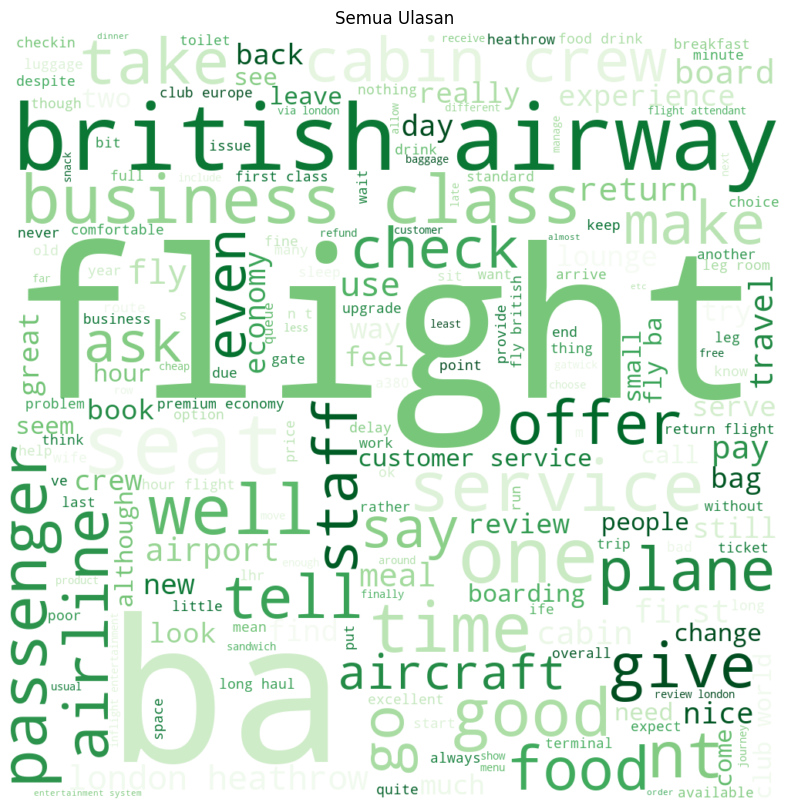

In [70]:
# Visualisasi frekuensi kemunculan kata

all_text = ' '.join(word for word in df["Clean"])
wordcloud = WordCloud(colormap='Greens', width=1000, height=1000, mode='RGBA', background_color='white').generate(all_text)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Semua Ulasan")
plt.margins(x=0, y=0)
plt.show()

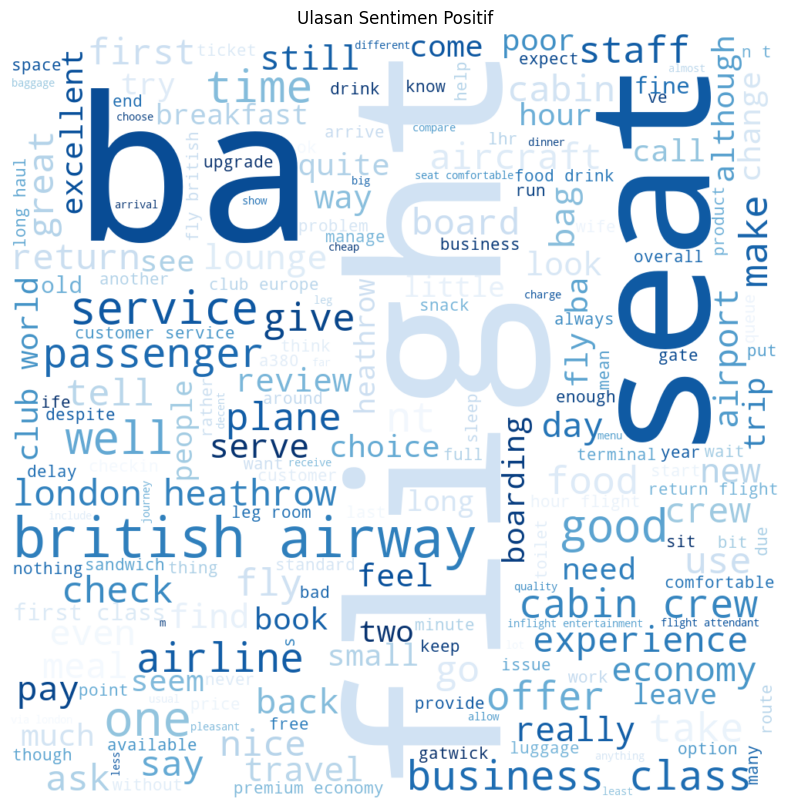

In [81]:
# Membuat Frekuensi kemunculan kata dari Fitur Sentimen yang positive
all_text = ' '.join(word for word in df[df['sentiment']=='Positive']["Clean"])
wordcloud = WordCloud(colormap='Blues', width=1000, height=1000, mode='RGBA', background_color='white').generate(all_text)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Ulasan Sentimen Positif")
plt.margins(x=0, y=0)
plt.show()

In [108]:
tokens = nltk.word_tokenize(' '.join(word for word in df[df['sentiment']=='Positive']["Clean"]))
freq_dist = Counter(tokens)

print(freq_dist.most_common(10))

[('flight', 5471), ('seat', 3442), ('ba', 3225), ('service', 2127), ('good', 2124), ('fly', 1907), ('time', 1799), ('food', 1777), ('crew', 1765), ('cabin', 1574)]


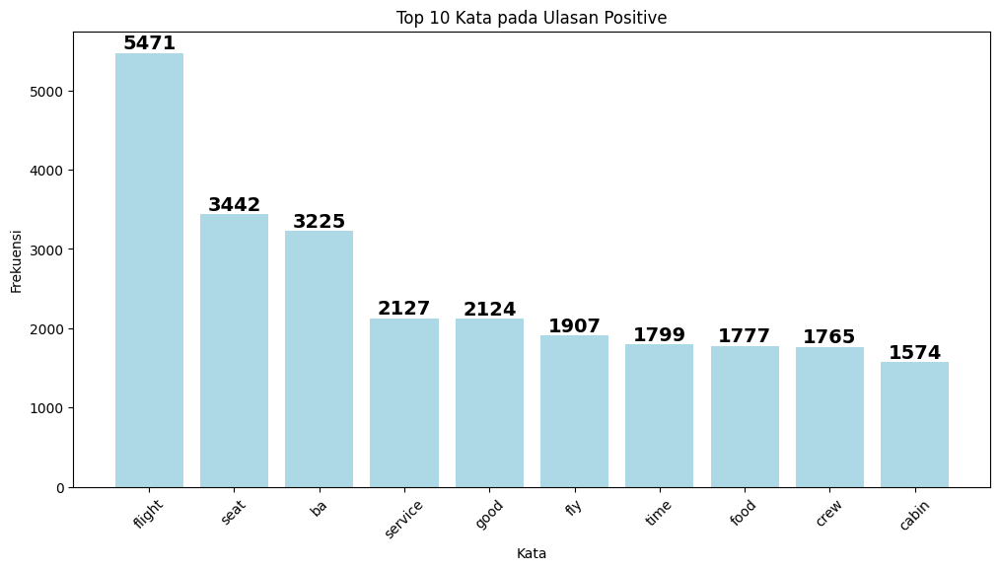

In [112]:
plt.figure(figsize=(12, 6))
top_words = freq_dist.most_common(10)
plt.bar([word[0] for word in top_words], [freq[1] for freq in top_words], color='#ADD8E6')
plt.title("Top 10 Kata pada Ulasan Positive")
plt.xlabel("Kata")
plt.ylabel("Frekuensi")
plt.xticks(rotation=45)

# Menampilkan frekuensi di dalam bar
for i, freq in enumerate(top_words):
    plt.text(i, freq[1], str(freq[1]), horizontalalignment='center', verticalalignment='bottom', fontdict={'fontweight': 'bold', 'size': 14})

plt.show()

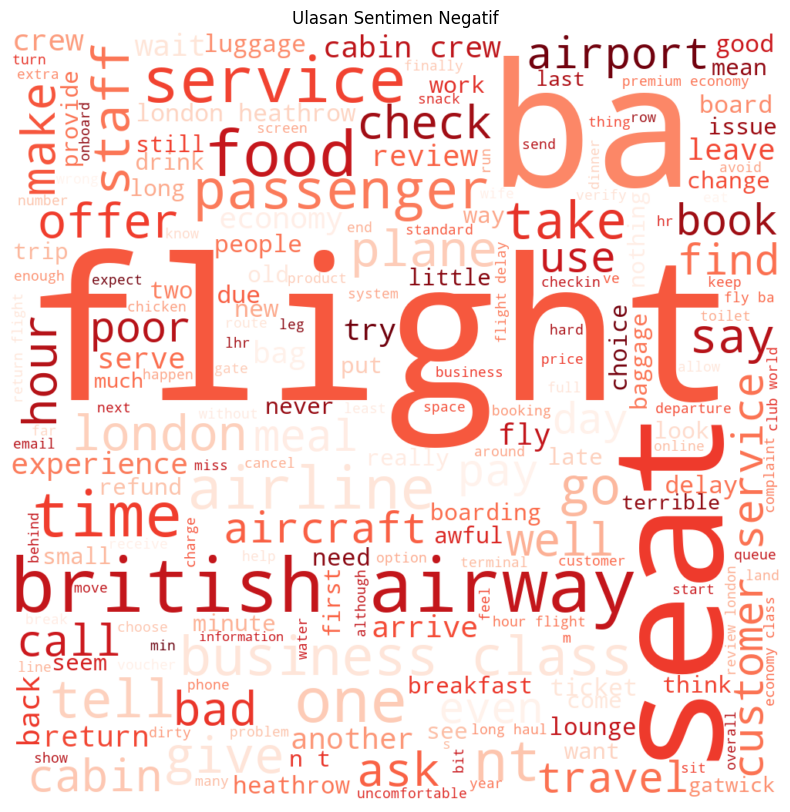

In [82]:
# Membuat Frekuensi kemunculan kata dari Fitur Sentimen yang Negative

all_text = ' '.join(word for word in df[df['sentiment']=='Negative']["Clean"])
wordcloud = WordCloud(colormap='Reds', width=1000, height=1000, mode='RGBA', background_color='white').generate(all_text)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Ulasan Sentimen Negatif")
plt.margins(x=0, y=0)
plt.show()

In [94]:
tokens = nltk.word_tokenize(' '.join(word for word in df[df['sentiment']=='Negative']["Clean"]))
freq_dist = Counter(tokens)

print(freq_dist.most_common(10))

[('flight', 1624), ('seat', 993), ('ba', 983), ('service', 619), ('british', 550), ('airway', 536), ('london', 530), ('hour', 495), ('get', 473), ('food', 467)]


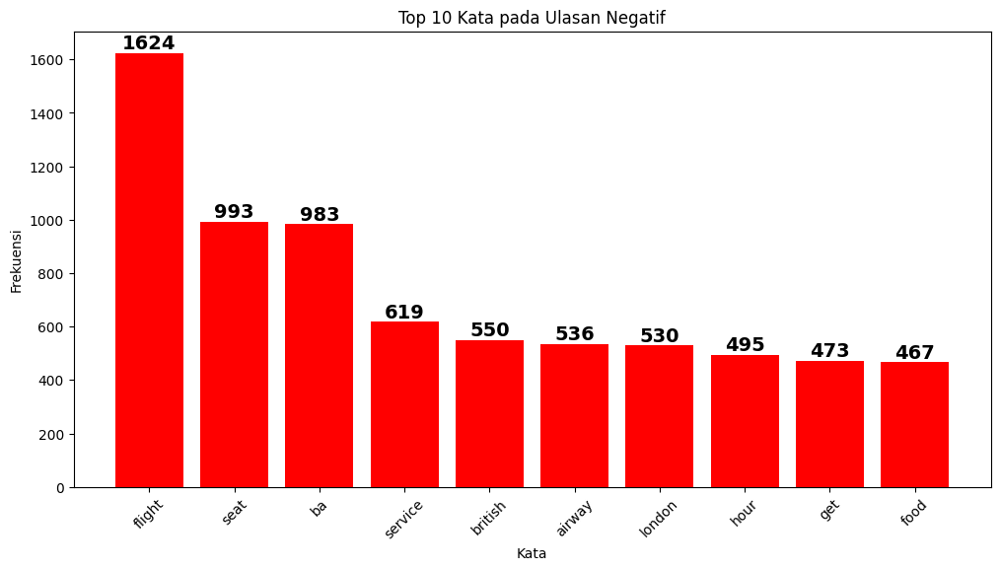

In [106]:
plt.figure(figsize=(12, 6))
top_words = freq_dist.most_common(10)
plt.bar([word[0] for word in top_words], [freq[1] for freq in top_words], color='red')
plt.title("Top 10 Kata pada Ulasan Negatif")
plt.xlabel("Kata")
plt.ylabel("Frekuensi")
plt.xticks(rotation=45)

# Menampilkan frekuensi di dalam bar
for i, freq in enumerate(top_words):
    plt.text(i, freq[1], str(freq[1]), horizontalalignment='center', verticalalignment='bottom', fontdict={'fontweight': 'bold', 'size': 14})

plt.show()

# TF-IDF